# Practical assignment Linear Discriminant Analysis, Nonlinear Discriminant Analysis, and Naïve Bayes with Scikit Learn
### Master in Data Science and Big Data

#### Instructor: Irene Rodríguez Luján

In this assignment, we'll go deeper on the fundamentals behind Linear Discriminant Analysis, Nonlinear Discriminant Analysis, and Naïve Bayes. Additionally, we will use the Scikit-learn implementation of these methods in a real-world dataset.

## Guideliness

Throughout this notebook you will find empty cells that you will need to fill with your own code. Follow the instructions in the notebook and pay special attention to the following symbols.


<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td>You will need to solve a question by writing your own code or answer in the cell immediately below or in a different file, as instructed.</td></tr>
 <tr><td width="80"><img src="img/exclamation.png" style="width:auto;height:auto"></td><td>This is a hint or useful observation that can help you solve this assignment. You should pay attention to these hints to better understand the assignment.</td></tr>

During the assignment you will make use of several Python packages that might not be installed in your machine. If that is the case, you can install new Python packages with

    conda install PACKAGENAME
    
if you are using Python Anaconda. Else you should use

    pip install PACKAGENAME

We will use **Python 3.7**. You will need the following packages for this particular assignment. Make sure they are available before proceeding:

* **numpy** - 1.19.2
* **pandas** - 1.1.3
* **matplotlib** - 3.3.4
* **scikit-learn** - 0.23.2
* **pandas-profiling** - 2.9.0

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as ma
import matplotlib.font_manager as fm
import sklearn as skl
import pandas_profiling as pdprof
import matplotlib

The following code makes plots appear on the notebook instead of showing them in a new window/tab.

In [2]:
%matplotlib inline

The following code shows packages' versions:

In [3]:
print("numpy: ", np.__version__)
print("pandas: ", pd.__version__)
print("matplotlib: ", matplotlib.__version__)
print("Scikit-learn: ", skl.__version__)
print("Pandas profiling: ", pdprof.__version__)

numpy:  1.19.2
pandas:  1.1.3
matplotlib:  3.3.4
Scikit-learn:  0.23.2
Pandas profiling:  2.9.0


Lastly, if you need any help on the usage of a Python function you can place the writing cursor over its name and press Caps+Shift to produce a pop-out with related documentation. This will only work inside code cells.

Let's go!

# One step further on LDA

* We will work with the iris dataset. The iris dataset is a classic and very easy multi-class classification dataset; in fact, this is perhaps the best known database to be found in the pattern recognition literature.

* The dataset contains 3 classes of 50 instances each, where each class refers to a type of iris plant. One class is linearly separable from the other 2; the latter are NOT linearly separable from each other.

* Predicted attribute: class of iris plant (iris Setosa, Iris Versicolour, Iris Virginica)

* Attributes (predictors): sepal length in cm, sepal width in cm, petal length in cm, petal width in cm

The following code uses the `load_iris` function available in scikit learn to load the iris dataset. The `X` variable is a numpy array of dimensions (150,4): 150 samples and 4 attributes. The `y` variable is a numpy vector with 150 entries corresponding to the target for each sample. `y` takes 3 different values corresponding to the three classes of iris plant (setosa, veriscolour, and virginica).

In [4]:
from sklearn.datasets import load_iris

data = load_iris()
X=data['data']
y=data['target']

print("X shape: ", X.shape)
print("y shape: ", y.shape)
print("y unique values: ", np.unique(y))
print("target names: ", data['target_names'])

X shape:  (150, 4)
y shape:  (150,)
y unique values:  [0 1 2]
target names:  ['setosa' 'versicolor' 'virginica']


<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.5 points]</b> Train a Linear Discriminant over the iris data using the <a href="https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.LinearDiscriminantAnalysis.html">Scikit Learn implementation</a> with the default parameters. Print the class priors means, and the covariance matrix computed by the algorithm (to get the covariance matrix you need to set `store_covariance=True`).
 </td></tr>
</table>

In [11]:
### WRITE YOUR CODE HERE
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

clf = LDA(store_covariance=True)
clf.fit(X, y)

print('Class priors')
print(clf.priors_)
print()

print('Class means')
print(clf.means_)
print()

print('Covariace matrix')
print(clf.covariance_)
print()

Class priors
[0.33333333 0.33333333 0.33333333]

Class means
[[5.006 3.428 1.462 0.246]
 [5.936 2.77  4.26  1.326]
 [6.588 2.974 5.552 2.026]]

Covariace matrix
[[0.259708   0.09086667 0.164164   0.03763333]
 [0.09086667 0.11308    0.05413867 0.032056  ]
 [0.164164   0.05413867 0.181484   0.041812  ]
 [0.03763333 0.032056   0.041812   0.041044  ]]



Now, in order to better understand LDA, we are going to reproduce the computation of class priors and means, and the pooled covariance matrix using numpy.

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[1 point]</b> Compute the class priors, class means and the pooled covariance matrix $\Sigma$ using the equations provided in the theoretical part of the course. Print your results, and compare them to the ones provided by de Scikit Learn Function. Some numpy functions that may be useful are <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.sum.html">np.sum</a>, <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.mean.html">np.mean</a> and <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.cov.html">np.cov</a> with parameters rowvar=False,bias=True.
 </td></tr>
</table>

In [13]:
### WRITE YOUR CODE HERE

N_k = np.array([len(y[y == k]) for k in np.unique(y)])

#class priors 
p_k = np.array([len(y[y == k])/len(y) for k in np.unique(y)])
print('Class priors computed')
print(p_k)
print()

#class means uk
u_k = np.array([np.mean(X[y==k], axis=0) for k in np.unique(y)])
print('Class means computed')
print(u_k)
print()

#covariance matrix
s_w = np.array([p_k[k] * np.cov(X[y==k], rowvar=False, bias=True) for k in np.unique(y)]).sum(axis=0)
print('Covariance matrix computed')
print(s_w)

Class priors computed
[0.33333333 0.33333333 0.33333333]

Class means computed
[[5.006 3.428 1.462 0.246]
 [5.936 2.77  4.26  1.326]
 [6.588 2.974 5.552 2.026]]

Covariance matrix computed
[[0.259708   0.09086667 0.164164   0.03763333]
 [0.09086667 0.11308    0.05413867 0.032056  ]
 [0.164164   0.05413867 0.181484   0.041812  ]
 [0.03763333 0.032056   0.041812   0.041044  ]]


In the theoretical part of the course, we learnt that the number of components in LDA is given by min (𝑑, 𝐶−1), where d is the number of dimensions (attributes/predictors) in the dataset, and C is the number of clases. In the iris dataset, we have d=4 and C=3; so, we will expect to get at most 2 dimensions. The default behavior of the <a href="https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.LinearDiscriminantAnalysis.html">LinearDiscriminatAnalysis</a> function in Scikit Learn computes all the available components. The following code allows us to determine the number of components as well as the percentage of variance explained by each of them.

In [14]:
print("*** Number of components: ", len(clf.explained_variance_ratio_))
print("*** Percentage explained variance: ",100*clf.explained_variance_ratio_)

*** Number of components:  2
*** Percentage explained variance:  [99.1212605  0.8787395]


As expected, we got 2 components: $2=\min(d=4,C-1=3-1)$.

In the course, we learnt that the equation $\min(d,C-1)$ comes from the rank of $S_{W}^{-1}S_B$, which provides the solution to LDA directions.

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.5 points]</b> Compute matrix S_B using the equations seen in the theoretical part of the course. Then, compute $S_{W}^{-1}S_B$ (note that you have already calculated $S_W$ in the previous exercise). You can use the numpy function <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.matmul.html">numpy.matmul</a> for matrix multiplication, and the function <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.linalg.inv.html"> numpy.linalg.inv</a> for computing the matrix inverse. Finally, compute the rank of $S_{W}^{-1}S_B$ using the function <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.linalg.matrix_rank.html"> numpy.linalg.matrix_rank</a>. Do you get the result you expected?
 </td></tr>
</table>

In [17]:
### WRITE YOUR CODE HERE

#overall mean
u = np.mean(X, axis=0)

s_b = np.sum([N_k[k] * \
              np.reshape(u_k[k] - u, (4,1)).dot(np.reshape(u_k[k] - u, (4,1)).T) \
              for k in np.unique(y)], axis=0)

s_w_s_b = np.matmul(np.linalg.inv(s_w), s_b)
rank = np.linalg.matrix_rank(s_w_s_b)

print('S_B')
print(s_b)
print()

print('S_W_S_B')
print(s_w_s_b)
print()

print('Rank')
print(rank)

S_B
[[ 63.21213333 -19.95266667 165.2484      71.27933333]
 [-19.95266667  11.34493333 -57.2396     -22.93266667]
 [165.2484     -57.2396     437.1028     186.774     ]
 [ 71.27933333 -22.93266667 186.774       80.41333333]]

S_W_S_B
[[ -458.75540872   162.20739666 -1216.78840535  -518.79748085]
 [ -834.2458894    326.73279946 -2244.69179059  -946.16092587]
 [ 1211.61581728  -441.40778133  3226.73863511  1371.3097023 ]
 [ 1574.56228015  -512.97817369  4132.27872241  1776.88201028]]

Rank
2


### Write your answers to questions here

#TODO: After computing the between scatter matrix $𝑆_B$ and within scatter matrix $𝑆_{w}$, the rank of the resulting matrix $S_{W}^{-1}S_B$ corresponds with the expected value $\min(d,C-1)$ = 2.

Let's check that we're able to reproduce the solution provided by Scikit Learn LDA. The following code shows the normalized eigenvectors (L2 norm = 1) of the solution provided by Scikit Learn's LDA.

In [18]:
from numpy.linalg import norm

clf = LDA(store_covariance=True, solver='eigen')
clf.fit(X, y)
norms = norm(clf.scalings_,axis=0)
print("LDA normalized projections:")
print(clf.scalings_/norms)

LDA normalized projections:
[[ 0.20874182  0.00653196  0.3323622  -0.84538656]
 [ 0.38620369  0.58661055 -0.42130989  0.17830288]
 [-0.55401172 -0.25256154 -0.47796668  0.13576672]
 [-0.7073504   0.76945309  0.69540003  0.48486807]]


As we have seen in theory, the projection directions of LDA can be obtained by solving the generalized eigenvalue problem $S_Bw = \lambda S_W w$, and this is equivalent to find the eigenvalues and eigenvectors of $S_{W}^{-1}S_B$. 

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.25 points]</b> Given the matrix $S_{W}^{-1}S_B$ already computed in the previous exercise, compute its eigenvalues and eigenvectors using the function <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.linalg.eig.html">numpy.linalg.eig</a>. Read the documentation of this function in order to understand its inputs and outputs. Print the obtained eigenvectors and compare them to the normalized ones obtained from the Scikit Learn's LDA function. Do they match? Are they equivalent as projection directions? Now, normalize the eigenvalues you just have obtained in order to sum up to 1, does the result match with the explained variance provided by the Scikit Learn's LDA function?
 </td></tr>
</table>

In [20]:
### WRITE YOUR CODE HERE
eigenvalues, eigenvectors = np.linalg.eig(s_w_s_b)

print('Eigenvalues')
print(eigenvalues)
print()

print('Eigenvectors')
print(eigenvectors)

Eigenvalues
[ 4.82878938e+03  4.28086564e+01  1.03988738e-12 -5.07133625e-13]

Eigenvectors
[[ 0.20874182 -0.00653196  0.82807226 -0.53898864]
 [ 0.38620369 -0.58661055 -0.15345318  0.44431552]
 [-0.55401172  0.25256154 -0.10735924  0.48627705]
 [-0.7073504  -0.76945309 -0.52841504 -0.52498533]]


In [21]:
eig_norms = norm(eigenvalues,axis=0)

normalized_eig = eigenvalues/eig_norms
print('Normalized eigenvalues')
print(normalized_eig)

Normalized eigenvalues
[ 9.99960706e-01  8.86494955e-03  2.15343110e-16 -1.05018807e-16]


### Write your answers to questions here

#TODO: The computed eigenvectors match with the obtained from the Scikit Learn's LDA function. The normalized scaling of the features in the space are equivalent to the eigenvectors because it is demonstarted that resolving the optimization problem is equivalent to resolving the generalized eigenvalue problem. The normalized eigenvalues also match wtith the explained variance provided by scikit-learn LDA function.

It's time to use LDA as a projection direction, and as a predictor. In order to use LDA as a projection direction, we need to use the `transform` function of the Sklearn's LDA object.

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.25 points]</b> Project the iris data into the LDA subspace using the Scikit Learn's trained classifier. What is the dimension of the resulting matrix? Is it what you expected? Why? Why not?
 </td></tr>
</table>

Transformed variables dimension
(150, 2)


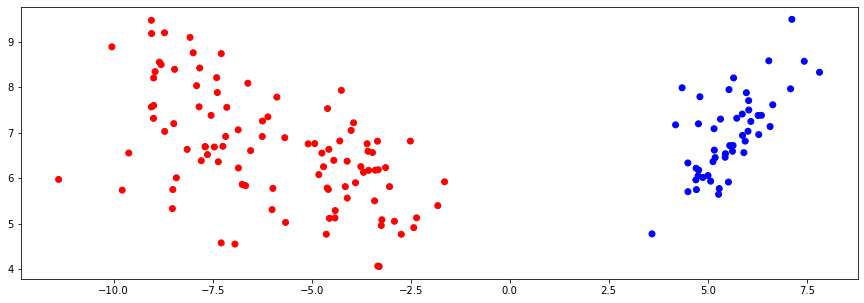

In [24]:
### WRITE YOUR CODE HERE
X_transf = clf.transform(X)
print('Transformed variables dimension')
print(X_transf.shape)

cm = ma.ListedColormap(['#0000FF', '#FF0000'])
plt.figure(figsize=(15,5))
plt.scatter(X_transf[:,0], X_transf[:,1], c=y, cmap=cm)

### Write your answers to questions here

The dimension of the resulting matrix is (150, 2) wich corresponds to the 150 observations and the two dimensions obtained after LDA reduction. In a classification problem with C classes, LDA projects data in space of dimensionality ≤ min (𝑑, 𝐶 − 1) = 2, as we have seen before. By applying LDA, the original function F is maximized by optimal linear transformation such that the projected data are most linearly separable. As we can see in the figure above, the observations in the new space are linearly separable so we expect the model to get very good results

In order to quantify the generalization capability of the LDA model, it is desirable to evaluate the predictive capability of the model in a subset of samples not seen during training. In order to split our original iris data into training and test subsets using the Sklearn's function <a href="https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html"> train_test_split</a>, the following code generates the following objects:
* `X_train` and `y_train`: predictors and labels for the training set.
* `X_test` and `y_test`: predictors and labels for the test set.

80\% of the whole dataset has been used for training, and the remaining 20\% has been used for test.


In [25]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.25 points]</b> Train Sklearn's LDA classifier over the training set, and evaluate the classification accuracy over the test set using the <a href="https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.LinearDiscriminantAnalysis.html#sklearn.discriminant_analysis.LinearDiscriminantAnalysis.predict">LDA's predict function</a>, and the Sklearn function <a href="https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html">accuracy_score</a>. Do you obtain a good result? How does it compare with respect to a random classifier? Try to justify your good/bad results.
 </td></tr>
</table>

In [57]:
### WRITE YOUR CODE HERE
from sklearn.metrics import accuracy_score

clf.fit(X_train, y_train)
preds = clf.predict(X_test)
acc_score = accuracy_score(y_test, preds)
print('LDA Accuracy')
print(f'{acc_score * 100}%')

LDA Accuracy
100.0%


### Write your answers to questions here

We have obtained a 100% accuracy over the test set. Let's plot the point projections in the new subspace.

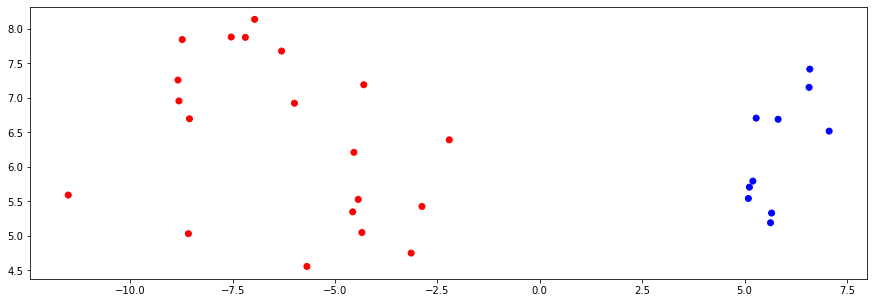

In [58]:
cm = ma.ListedColormap(['#0000FF', '#FF0000'])
plt.figure(figsize=(15,5))
x_transf = clf.transform(X_test)
plt.scatter(x_transf[:,0], x_transf[:,1], c=y_test, cmap=cm)

As we can see, the points are linearly separable in the new subspace. This is why we have reached a 100% accuracy. 

In [75]:
from sklearn.dummy import DummyClassifier

dclf = DummyClassifier(strategy="stratified")
dclf.fit(X_train, y_train)
dclf_preds = dclf.predict(X_test)
dclf_acc_score = accuracy_score(y_test, dclf_preds)
print('Accuracy')
print(f'{round(dclf_acc_score * 100,2)}%')

Accuracy
36.67%


The LDA classifier outperforms the Dummy Clasiffier

## One step further on QDA

The following code uses the Sklearn's implementation of Quadratic Disciminant Analysis (function <a href="https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis.html">QuadraticDiscriminantAnalysis</a>) to train a QDA classifier using the training data for the iris dataset previously generated.

In [61]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA

qda = QDA(store_covariance=True)
qda.fit(X,y)

QuadraticDiscriminantAnalysis(store_covariance=True)

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.75 points]</b> Compute the class priors, class means and the covariance matrices $\Sigma_i$ using the equations provided in the theoretical part of the course. Print your results, and compare them to the ones provided by de QDA Scikit Learn function. Some numpy functions that may be useful are <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.sum.html">np.sum</a>, <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.mean.html">np.mean</a> and <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.cov.html">np.cov</a> with parameters rowvar=False,bias=False.
 </td></tr>
</table>

In [62]:
### WRITE YOUR CODE HERE

#class priors 
p_k = np.array([len(y[y == k])/len(y) for k in np.unique(y)])
print('Computed class priors QDA')
print(p_k)
print()

#class means uk
u_k = np.array([np.mean(X[y==k], axis=0) for k in np.unique(y)])
print('Computed class means QDA')
print(u_k)
print()

#covariance matrices
s_w = np.array([np.cov(X[y==k], rowvar=False, bias=False) for k in np.unique(y)])
print('Computed covariance matrices')
print(s_w)

Computed class priors QDA
[0.33333333 0.33333333 0.33333333]

Computed class means QDA
[[5.006 3.428 1.462 0.246]
 [5.936 2.77  4.26  1.326]
 [6.588 2.974 5.552 2.026]]

Computed covariance matrices
[[[0.12424898 0.09921633 0.0163551  0.01033061]
  [0.09921633 0.1436898  0.01169796 0.00929796]
  [0.0163551  0.01169796 0.03015918 0.00606939]
  [0.01033061 0.00929796 0.00606939 0.01110612]]

 [[0.26643265 0.08518367 0.18289796 0.05577959]
  [0.08518367 0.09846939 0.08265306 0.04120408]
  [0.18289796 0.08265306 0.22081633 0.07310204]
  [0.05577959 0.04120408 0.07310204 0.03910612]]

 [[0.40434286 0.09376327 0.3032898  0.04909388]
  [0.09376327 0.10400408 0.07137959 0.04762857]
  [0.3032898  0.07137959 0.30458776 0.04882449]
  [0.04909388 0.04762857 0.04882449 0.07543265]]]


In [63]:
print('Sklearn class priors')
print(qda.priors_)
print()

print('Sklearn class means')
print(qda.means_)
print()

print('Sklearn covariance matrices')
for m in qda.covariance_:
    print(m)
    print()

Sklearn class priors
[0.33333333 0.33333333 0.33333333]

Sklearn class means
[[5.006 3.428 1.462 0.246]
 [5.936 2.77  4.26  1.326]
 [6.588 2.974 5.552 2.026]]

Sklearn covariance matrices
[[0.12424898 0.09921633 0.0163551  0.01033061]
 [0.09921633 0.1436898  0.01169796 0.00929796]
 [0.0163551  0.01169796 0.03015918 0.00606939]
 [0.01033061 0.00929796 0.00606939 0.01110612]]

[[0.26643265 0.08518367 0.18289796 0.05577959]
 [0.08518367 0.09846939 0.08265306 0.04120408]
 [0.18289796 0.08265306 0.22081633 0.07310204]
 [0.05577959 0.04120408 0.07310204 0.03910612]]

[[0.40434286 0.09376327 0.3032898  0.04909388]
 [0.09376327 0.10400408 0.07137959 0.04762857]
 [0.3032898  0.07137959 0.30458776 0.04882449]
 [0.04909388 0.04762857 0.04882449 0.07543265]]



<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.5 points]</b> Evaluate the classification accuracy over the test set using the <a href="https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis.html#sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis.predict">QDA's predict function</a>, and the Sklearn function <a href="https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html">accuracy_score</a>. Do you obtain a good result? How does it compare with respect to a random classifier and LDA? Try to justify your good/bad results.
 </td></tr>
</table>

In [65]:
### WRITE YOUR CODE HERE
qda = QDA(store_covariance=True)
qda.fit(X_train, y_train)
preds = qda.predict(X_test)
qda_acc_score = accuracy_score(y_test, preds)
print('QDA accuracy')
print(f'{round(qda_acc_score * 100, 2)}%')

print('LDA accuracy')
print(f'{acc_score * 100}%')

print('Dummy accuracy')
print(f'{round(dclf_acc_score * 100,2)}%')

QDA accuracy
96.67%
LDA accuracy
100.0%
Dummy accuracy
46.67%


### Write your answers to questions here

As we have seen above, by applying QDA we have obtained a 96% accuracy, which is a good result. However, LDA outperforms QDA and QDA outperforms Dummy again. In QDA, the decision boundary between two classes is given by a quadratic function. Although QDA tends to fit data better than LDA, it has more parameters to estimate. In this case, as we have seen previously, test data can be perfectly linearly separated that is why LDA did it so well. On the other hand, as QDA has more parameters to estimate, it would have need more data to perfectly fit all its parameters during training. In both cases, discriminant analysis perfoms better that the dummy classifier, as it is expected.

Let's generate a couple of non-linear separable synthetic datasets by using the Scikit Learn's functions make_moons and make_circles. These functions generate 2-dimensional binary datasets:

* **Moons** (function <a href="http://scikit-learn.org/stable/modules/generated/sklearn.datasets.make_moons.html">sklearn.datasets.make_moons</a>): Make two interleaving half circles.
* **Circles** (función <a href="http://scikit-learn.org/stable/modules/generated/sklearn.datasets.make_circles.html">sklearn.datasets.make_circles</a>): A circle inside another circle.

Both datasets are normalized so each varaible has mean 0 and standard deviation 1.

Let's take a look at the datasets!

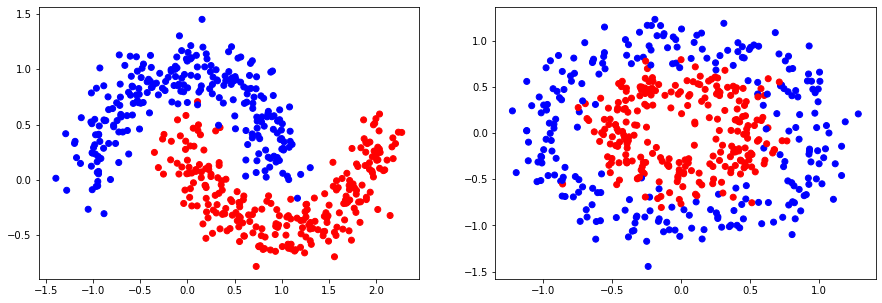

In [80]:
from sklearn import datasets

X_moons,y_moons = datasets.make_moons(n_samples=500,noise=0.15,random_state=1)
X_circles, y_circles = datasets.make_circles(n_samples=500, noise=0.15,factor=0.5,random_state=1)

cm = ma.ListedColormap(['#0000FF', '#FF0000'])    # blue, red
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.scatter(X_moons[:, 0], X_moons[:, 1], c=y_moons, cmap=cm)
plt.subplot(1,2,2)
plt.scatter(X_circles[:, 0], X_circles[:, 1], c=y_circles, cmap=cm)

plt.show()

Let's generate a training and test split for each of these datasets using the Scikit's function <a href="https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html"> train_test_split</a>.

In [81]:
Xmoons_train, Xmoons_test, ymoons_train, ymoons_test = train_test_split(X_moons, y_moons, test_size=0.2, random_state=42)
Xcircles_train, Xcircles_test, ycircles_train, ycircles_test = train_test_split(X_circles, y_circles, test_size=0.2, random_state=42)

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.5 points]</b> Train LDA and QDA classifiers (Sklearn implementation) over the moons and circles datasets and evaluate classifiers' accuracy over the test sets. Do you obtain a good result? How does it compare with respect to a random classifier and LDA? Try to justify your good/bad results.
 </td></tr>
</table>

In [85]:
### WRITE YOUR CODE HERE

moons_lda = LDA()
moons_lda.fit(Xmoons_train, ymoons_train)
moons_lda_preds = moons_lda.predict(Xmoons_test)
moons_lda_score = accuracy_score(ymoons_test, moons_lda_preds)
print('LDA moons accuracy', f'{moons_lda_score * 100}%')

moons_qda = QDA()
moons_qda.fit(Xmoons_train, ymoons_train)
moons_qda_preds = moons_qda.predict(Xmoons_test)
moons_qda_score = accuracy_score(ymoons_test, moons_qda_preds)
print('QDA moons accuracy:', f'{moons_qda_score * 100}%')

moons_dummy = DummyClassifier(strategy="stratified")
moons_dummy.fit(Xmoons_train, ymoons_train)
moons_dummy_preds = moons_dummy.predict(Xmoons_test)
moons_dummy_score = accuracy_score(ymoons_test, moons_dummy_preds)
print('Dummy moons accuracy:', f'{round(moons_dummy_score * 100,2)}%')

LDA moons accuracy 88.0%
QDA moons accuracy: 88.0%
Dummy moons accuracy: 57.0%


In [88]:
circles_lda = LDA()
circles_lda.fit(Xcircles_train, ycircles_train)
circles_lda_preds = circles_lda.predict(Xcircles_test)
circles_lda_score = accuracy_score(ycircles_test, circles_lda_preds)
print('LDA circles accuracy', f'{circles_lda_score * 100}%')

circles_qda = QDA()
circles_qda.fit(Xcircles_train, ycircles_train)
circles_qda_preds = circles_qda.predict(Xcircles_test)
circles_qda_score = accuracy_score(ycircles_test, circles_qda_preds)
print('QDA circles accuracy', f'{circles_qda_score * 100}%')

circles_dummy = DummyClassifier(strategy="stratified")
circles_dummy.fit(Xcircles_train, ycircles_train)
circles_dummy_preds = circles_dummy.predict(Xcircles_test)
circles_dummy_score = accuracy_score(ycircles_test, circles_dummy_preds)
print('Dummy circles accuracy:', f'{round(circles_dummy_score * 100,2)}%')

LDA circles accuracy 43.0%
QDA circles accuracy 96.0%
Dummy circles accuracy: 44.0%


### Write your answers to questions here

In the first dataset, LDA and QDA obtain very similar results, which are not so good. Looking at data, it is clear data points are not linearly separable so it is expected the LDA to fail in some cases. On the other hand, although data can be has quadratic decision boundaries, QDA was not able to learn well this data. In this case it can be said that linear/quadratic decision boundaries may not represent the genuine decision boundary in the data. Still, both models are better than the dummy which reached a low accuracy.

In the second dataset, because data is not linearly separable LDA obtain very bad results, so bad results are similar to the dummy classifier ones. If we look at the dataset image, it is impossible data could be fitted with linear boundaries. On the other hand, in this complex data, QDA obtain much better results using a quadratic desicion boundary. 

The function `plot_decision_boundary` allows you to visualize the decision boundary of the classifiers. The function has three inputs (in this order):
1. Sklearn model
2. X
3. y

The code below shows the decision boundary over the test set of a linearly separable dataset for the LDA and QDA classifiers.

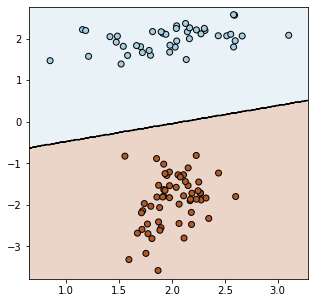

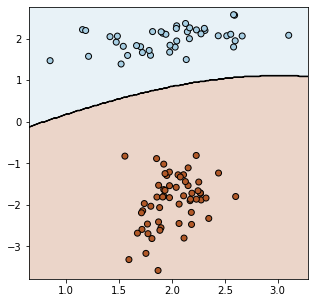

In [89]:
from plot_decision_boundary import plot_decision_boundary

X_linear, y_linear =  datasets.make_classification(n_samples=500, n_features=2,
                                                   n_informative=2, n_redundant=0,
                                                   n_clusters_per_class=1, flip_y=-1,
                                                  class_sep=2)

Xlinear_train, Xlinear_test, ylinear_train, ylinear_test = train_test_split(X_linear, y_linear, test_size=0.2, random_state=42)

lda = LDA()
lda.fit(Xlinear_train,ylinear_train)

qda = QDA()
qda.fit(Xlinear_train,ylinear_train)

plot_decision_boundary(lda,Xlinear_test,ylinear_test)
plot_decision_boundary(qda,Xlinear_test,ylinear_test)

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.25 points]</b> Using the function plot_decision_boundary, show the decision boundaries over the test sets of the four classifiers trained in the previous exercise.
 </td></tr>
</table>

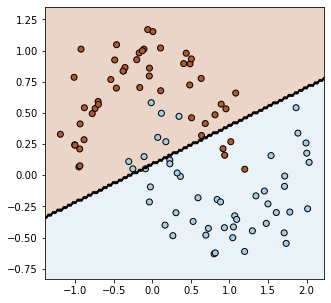

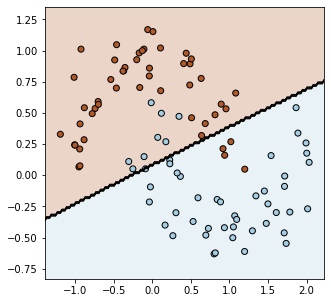

In [90]:
### WRITE YOUR CODE HERE
#Moons
plot_decision_boundary(moons_lda,Xmoons_test,ymoons_test)
plot_decision_boundary(moons_qda,Xmoons_test,ymoons_test)

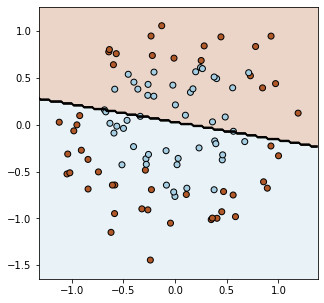

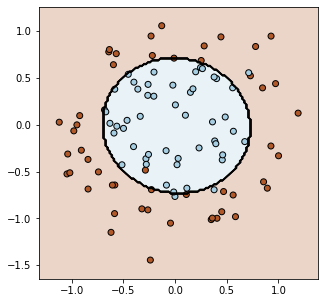

In [91]:
#Circles
plot_decision_boundary(circles_lda,Xcircles_test,ycircles_test)
plot_decision_boundary(circles_qda,Xcircles_test,ycircles_test)

## One step further on KDA

KDA is not implemented in Scikit Learn, so we are going to use an adaptation of an open-source implementation available <a href="https://github.com/bhaktipriya/Kernel-PCA-and-LDA/blob/master/klda.py">here</a>.

We are going to consider two kernels: 
- Linear kernel: no changes are made on the input space.
- RBF Kernel: nonlinear transformations on the input space.

We'll be working with the circles dataset.

<table align="left">
<tr><td width="80"><img src="img/exclamation.png" style="width:auto;height:auto"></td><td> Explore the code below and make sure you understand what it is doing.</td></tr>
</table>

In [117]:
from klda import klda
from sklearn import svm

# KDA tranformation to the feature space
# classes needs to be {-1,1}
print('Clases', np.unique(y_circles))
y_circles_transf=y_circles
y_circles_transf[y_circles==0]=-1
X_circles_transf = klda(X_circles, y_circles)

# We split the transformed data in training and test
Xtransf_train, Xtransf_test, ytransf_train, ytransf_test = train_test_split(X_circles_transf, y_circles_transf, test_size=0.2, random_state=42)

# Train a SVM classifier with RBF kernel (nonlinear classifier)
clf_rbf = svm.SVC(kernel='rbf', C=1).fit(Xtransf_train, ytransf_train)
print("% Accuracy rbfsvm", 100*clf_rbf.score(Xtransf_test, ytransf_test))

# Train a SVM classifier with a linear kernel (linear classifier)
clf_linear = svm.SVC(kernel='linear', C=1).fit(Xtransf_train, ytransf_train)
print("% Accuracy linear", 100*clf_linear.score(Xtransf_test, ytransf_test))

Clases [-1  1]
Class 1 samples 250
Class 2 samples 250
(500, 500) (500, 500) (500, 500)
alpha inv (500,)
alpha solv (500,)
shape (500, 500) (500,)
(500,) result
% Accuracy rbfsvm 95.0
% Accuracy linear 94.0


<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td><b>[0.25 points]</b> As you can see, both SVMs (nonlinear and linear) obtain the same result. Why?
 </td></tr>
</table>

### Write your answers to questions here

As we have seen before this dataset, classes are separable by a nonlinear function. By applying klda, data is transformed from two dimensions to one dimension so in the new feature space, the problem becomes linearly separable. This is why the linear SVM reachs as good results as the nonlinear one.

In the next figure, it can be seen how test data look like after being transformed in the new feature space. Both linear and nonlinear kernels can separate data easily, but with some mistakes yet.

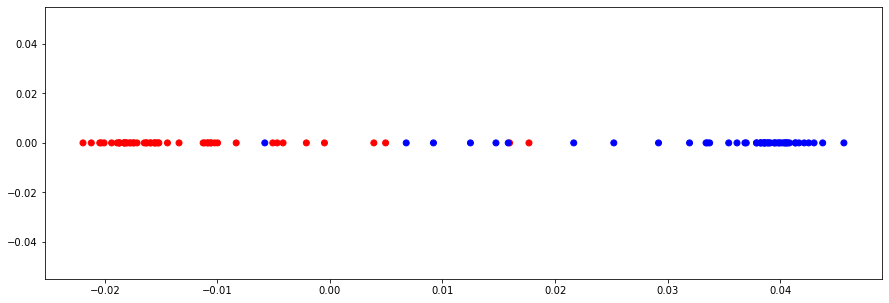

In [118]:
cm = ma.ListedColormap(['#0000FF', '#FF0000'])    # blue, red
plt.figure(figsize=(15,5))
aux = np.zeros((Xtransf_test.shape[0],2))
aux[:,0] = Xtransf_test[:,0]
plt.scatter(aux[:,0], aux[:,1], c=ytransf_test, cmap=cm)

<table align="left">
<tr><td width="80"><img src="img/exclamation.png" style="width:auto;height:auto"></td><td> For simplicity, we have compute de KDA projection on the whole circles dataset; however, in practice and real-world secarios KDA directions must be computed <b> only using the training data</b>.</td></tr>
</table>

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.5 points]</b> What is the dimension of the transformed data in the kernel space? Why? Plot the projected test data using matplotlib and differentiating the points in two classes with different colors. Do you think KDA get a good separation? HINT: It may be useful to see what we did to plot circles and moons datasets. You may also need to fill some dimensions with zeros. </td></tr>
</table>

In [119]:
print("Dimensions transformed data: ", Xtransf_train.shape)

Dimensions transformed data:  (400, 1)


### Write your answers to questions here

The transformed data has dimension (400, 1) wich means that we have just one predictor now. This dimension is due to KFDA, in a classification problem like this one, projects data into a $C-1$ dimensional space, where $C$ is the number of classes, in this case, 2.

The projected test data differentiating the points in two classes by color can be observed in the image above. 

KDA did get a good separation, even when it could have done a better one with equally linear. This following features show the separation done by each of the models (linear and nonlinear) over teh test data. It can be seen that the decision boundaries in both cases is very close to the best one. The just differ in one point.

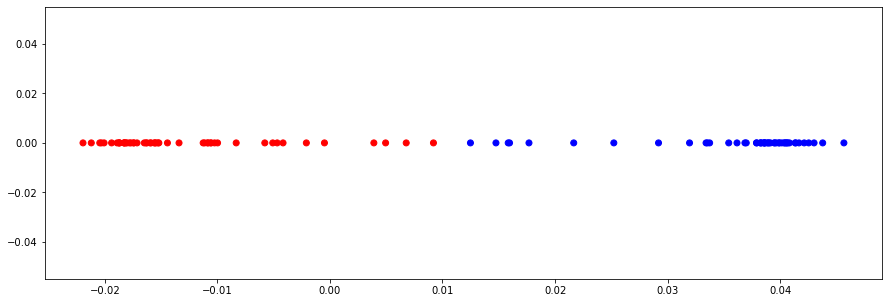

In [124]:
# WRITE YOUR CODE HERE

ypreds_rbf = clf_rbf.predict(Xtransf_test)

cm = ma.ListedColormap(['#0000FF', '#FF0000'])    # blue, red
plt.figure(figsize=(15,5))
aux = np.zeros((Xtransf_test.shape[0],2))
aux[:,0] = Xtransf_test[:,0]
plt.scatter(aux[:,0], aux[:,1], c=ypreds_rbf, cmap=cm)

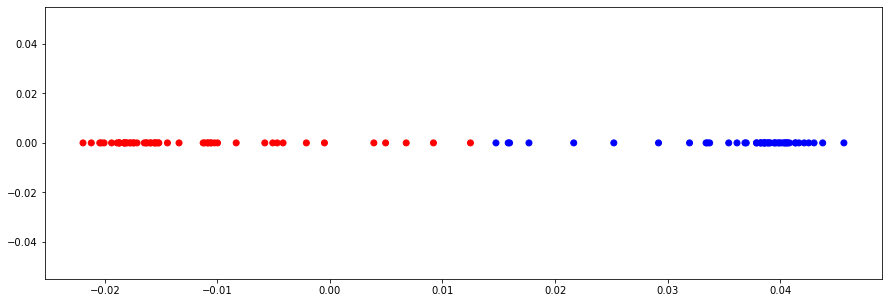

In [125]:
ypreds_linear = clf_linear.predict(Xtransf_test)

cm = ma.ListedColormap(['#0000FF', '#FF0000'])    # blue, red
plt.figure(figsize=(15,5))
aux = np.zeros((Xtransf_test.shape[0],2))
aux[:,0] = Xtransf_test[:,0]
plt.scatter(aux[:,0], aux[:,1], c=ypreds_linear, cmap=cm)

## One step further on  Naïve Bayes

It's time to move to Naïve Bayes. We'll use again the iris dataset, so we are going to generate the training and test splits:

In [126]:
X, y = load_iris(return_X_y=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=0)

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.5 points]</b> Train a Naïve Bayes classifier over the iris data (training partition) using the <a href="https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html">Scikit Learn implementation</a> with the default parameters. Print the class counts, class priors, and the means and variances for the gaussians associated to each variable.
 </td></tr>
</table>

In [127]:
### WRITE YOUR CODE HERE
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(X_train, y_train)

GaussianNB()

In [131]:
print('Sklearn class count')
print(gnb.class_count_)
print()

print('Sklearn class priors')
print(gnb.class_prior_)
print()

print('Sklearn class means ')
print(gnb.theta_)
print()

print('Sklearn variance matrices')
print( gnb.sigma_)
print()

Sklearn class count
[29. 20. 26.]

Sklearn class priors
[0.38666667 0.26666667 0.34666667]

Sklearn class means 
[[4.97586207 3.35862069 1.44827586 0.23448276]
 [5.935      2.71       4.185      1.3       ]
 [6.77692308 3.09230769 5.73461538 2.10769231]]

Sklearn variance matrices
[[0.10321047 0.13208086 0.01629013 0.00846612]
 [0.256275   0.0829     0.255275   0.046     ]
 [0.38869823 0.10147929 0.31303255 0.04763314]]



<table align="left">
<tr><td width="80"><img src="img/exclamation.png" style="width:auto;height:auto"></td><td> Note that we are using the Gaussian Naïve Bayes implementation because all the attributes in the iris dataset are continuous.</td></tr>
</table>

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.75 points]</b> Compute the class priors, and the means and variances for each gaussian using numpy. Print them and make sure they match with the results provided by the Sklearn implementation of GaussianNB.Some numpy functions that may be useful are <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.sum.html">np.sum</a>, <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.mean.html">np.mean</a> and <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.var.html">np.var</a>.
 </td></tr>
</table>

In [132]:
### WRITE YOUR CODE HERE

N_k = np.array([[len(y_train[y_train == k]) for k in np.unique(y_train)]])
print('Computed class counts')
print(N_k)
print()

p_k = np.array([len(y_train[y_train == k])/len(y_train) for k in np.unique(y_train)])
print('Computed class priors')
print(p_k)
print()

u_k = np.array([np.mean(X_train[y_train==k], axis=0) for k in np.unique(y_train)])
print('Computed class maens')
print(u_k)
print()

s_w = np.array([np.var(X_train[y_train==k], axis=0) for k in np.unique(y_train)])
print('Computed covariance matrices')
print(s_w)

Computed class counts
[[29 20 26]]

Computed class priors
[0.38666667 0.26666667 0.34666667]

Computed class maens
[[4.97586207 3.35862069 1.44827586 0.23448276]
 [5.935      2.71       4.185      1.3       ]
 [6.77692308 3.09230769 5.73461538 2.10769231]]

Computed covariance matrices
[[0.10321046 0.13208086 0.01629013 0.00846611]
 [0.256275   0.0829     0.255275   0.046     ]
 [0.38869822 0.10147929 0.31303254 0.04763314]]


It's time to make predictions. Instead of using the `predict` function in GaussianNB, we are going to use the <a href="https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html#sklearn.naive_bayes.GaussianNB.predict_log_proba">predict_log_proba</a> function that returns log-probability estimates for the test vector X. It is better to avoid numerical issues when computing the posterior probabilities in Naïve Bayes.

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.25 points]</b> Compute the predicted log-probabilities over the test partition using the GaussianNB Sklearn classifier and the predict_log_proba function.
 </td></tr>
</table>

In [133]:
y_pred_proba = gnb.predict_log_proba(X_test)
y_pred_proba.shape

(75, 3)

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td> <b>[0.5 points]</b> Let's try to reproduce the predictions made by Scikit Learn. Using the class priors and the gaussians means and variances you computed, estimate the log probabilities for the first sample in the test partition (X[0:1,:]), and make sure that these probabilites are the same as those obtained in the previous exercise. It may be useful to use the Python implementation for gaussians in <a href="https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.norm.html"> scipy.stats.norm</a>, and the function <b>logpdf</b> to estimate the probability of a datapoint. Recall that SCikit Learn normalizes the output probabilitiues by their maximm value.
 </td></tr>
</table>

In [ ]:
### WRITE YOUR CODE HERE

#TODO
from scipy.stats import norm

d = X_test.shape[1] 
x = X_test[0]

# log probabilities for the first sample 

y=0
i=1
first_p_x_1 = 1/(((2*np.pi)**(d/2) * s_w[y][i])**1/2)
second_p_x_1 = -(((x[i] - u_k[y][i])**2)/(2*(s_w[y][i]**2)))
p_x_1 = first_p_x_1**second_p_x_1


def p_xi_y(i, y):
    first_p_x_1 = 1/(((2*np.pi)**(d/2) * s_w[y][i])**1/2)
    second_p_x_1 = -(((x[i] - u_k[y][i])**2)/(2*(s_w[y][i]**2)))
#     p_x_1 = first_p_x_1**second_p_x_1
    p_x_1 = first_p_x_1*np.exp(second_p_x_1)
    return p_x_1


l, prob = [], []
for y in pd.unique(y_test):
    n = [p_xi_y(i, y) for i in range(0,d)]
    prob.append(np.sum(n))
    l.append(n)


print(x, y_pred_proba[0:1], y_test[0:1])

In [ ]:
y=0
i=1
first_p_x_1 = 1/(((2*np.pi)**(d/2) * s_w[y][i])**1/2)
second_p_x_1 = -(((x[i] - u_k[y][i])**2)/(2*(s_w[y][i]**2)))
p_x_1 = first_p_x_1* np.exp(second_p_x_1)

In [ ]:
p_x_1

In [ ]:
prob

In [ ]:
l

<table align="left">
<tr><td width="80"><img src="img/exclamation.png" style="width:auto;height:auto"></td><td>The same computations can be done with the other Naïve Bayes implementations in Scikit Learn: <a href="https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html">MultinomialNB</a>, <a href="https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.BernoulliNB.html"> BernoulliNB</a>, and <a href="https://scikit-learn.org/stable/modules/naive_bayes.html">Categorical NB</a>. <b>Make sure you also understand the fundamentals behind these implementations!</b></td></tr>
</table>

<table align="left">
<tr><td width="80"><img src="img/exclamation.png" style="width:auto;height:auto"></td><td>In the previous exercise, we have not created training/validation/test partitions (we only used training and test partitions) since we did not adjust any hyperparameters in the classifiers. Please, remember that you need to generate these three datasets in case you need to perform some kind of hyperparameter optimization.</td></tr>
</table>

## A real-world example: default of credit card clients

Let's apply what we've learnt over a real-world dataset. We will work with an adapted version of a dataset regarding credit card unpayment in Taiwan. This dataset is publicly available at the <a href="https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients">UCI Machine Learning Repository</a>, but the dataset that we are going to use is modified version of the original one, and it is stored in the file `default_credit.csv`.

In the UCI website you can find detailed information about the dataset. In general, the idea is to predict credit card unpayment (variable `X24_default payment next month`) in the following month at which the data is referred to. Each row in the dataset (sample/pattern) represents a customer, and the following variables (predictors/attributes) are available for each customer:

* **X1**: Amount of the given credit (NT dollar): it includes both the individual consumer credit and his/her family (supplementary) credit.
* **X2**: Gender (male;female).
* **X3**: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others).
* **X4**: Marital status (married;single;others).
* **X5**: Age (year).
* **X6 - X11**: History of past payment. We tracked the past monthly payment records (from April to September, 2005) as follows: X6 = the repayment status in September, 2005; X7 = the repayment status in August, 2005; . . .;X11 = the repayment status in April, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.
* **X12-X17**: Amount of bill statement (NT dollar). X12 = amount of bill statement in September, 2005; X13 = amount of bill statement in August, 2005; . . .; X17 = amount of bill statement in April, 2005.
* **X18-X23**: Amount of previous payment (NT dollar). X18 = amount paid in September, 2005; X19 = amount paid in August, 2005; . . .;X23 = amount paid in April, 2005. 


Features names are `X_i` followed by a descriptive text for the variable.

The following code loads the dataset as a Pandas dataframe, and obtains the following two dataframes:
* **df_y**: dataframe with a single column with the binary target variable `X24_default payment next month`(0: paid / 1:unpaid).
* **df_X**: dataframe with columns corresponding to the predictors.

The last line of code shows the names of the independent variables (predictors).

<table align="left">
<tr><td width="80"><img src="img/exclamation.png" style="width:auto;height:auto"></td><td>The following code also removes categorical features in order to make the application of LDA, QDA and Naïve Bayes straightforward.</td></tr>
</table>

In [134]:
data = pd.read_csv("default_credit.csv",sep=";")


# Remove categorical features
data.drop(columns=['X2_GENDER', 'X3_EDUCATION', 'X4_MARITAL_STATUS','X6_PAY_0', 'X7_PAY_2', 'X8_PAY_3', 'X9_PAY_4', 'X10_PAY_5',
       'X11_PAY_6'], inplace=True)

# Dataframe with the target variable
df_y = data['X24_default payment next month']


# Dataframe with the predictors (all features except for the target variable)
df_X = data.drop('X24_default payment next month',axis=1)

print(df_X.columns)

Index(['X1_LIMIT_BAL', 'X5_AGE', 'X12_BILL_AMT1', 'X13_BILL_AMT2',
       'X14_BILL_AMT3', 'X15_BILL_AMT4', 'X16_BILL_AMT5', 'X17_BILL_AMT6',
       'X18_PAY_AMT1', 'X19_PAY_AMT2', 'X20_PAY_AMT3', 'X21_PAY_AMT4',
       'X22_PAY_AMT5', 'X23_PAY_AMT6'],
      dtype='object')


<table align="left">
<tr><td width="80"><img src="img/exclamation.png" style="width:auto;height:auto"></td><td>The following code uses the package Pandas Profiling, which is very useful for exploring our data.</td></tr>
</table>

In [135]:
from pandas_profiling import ProfileReport

profile = ProfileReport(data, title="Pandas Profiling Report")

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td>
     <b>[0.25 points]</b> Compute what is the prior probability of the positive class. Taking into account the obtained result, what metrics would you use to measure the performance of your classification model? Why?
 </td></tr>
</table>

In [138]:
### WRITE YOUR CODE HERE
len(df_y[df_y == 0])/len(df_y)

0.7788

### Write your answers to questions here

The positive class prior shows that we are dealing with an imabalanced data problem, because the 77% of our data belongs to the same class, while just the 22% belongs to the other one. In classification problems, we usually computed the accuracy based on the confusion matrix. The confusion matrix provides insight into which classes are being predicted correctly and which incorrectly. In the case of imbalanced data, the expected behaviour of a model is to learn to predict the most common class. In this case the accuracy is not the correct metric to use because it ponderates an error in any of the classes equally without taking into account the sample size. The most commonly used for comparing classification models for imbalanced problems is the ROC Area Under Curve (AUC).

Also, for imbalanced classification with a severe skew and few examples of the minority class, the ROC AUC can be misleading. This is because a small number of correct or incorrect predictions can result in a large change in the ROC Curve or ROC AUC score. For this reason is also recommended to use the Precision-Recall Curve AUC.

In what follows, we will use the **Area Under the Curve (AUC)** to measure the model performance. This metric is implemented by the function <a href="https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html">roc_auc_score</a> in Scikit Learn.

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td>
     <b>[0.25 points]</b> Make a random training/test partition of the dataset using 80\% of data for traning, and 20\% of data for test. Remember to set a random seed to some number in order to have reproducible results across different executions.
 </td></tr>
</table>

In [139]:
### WRITE YOUR CODE HERE
X_train, X_test, y_train, y_test = train_test_split(df_X, df_y, test_size=0.2, random_state=42)

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td>
     <b>[0.5 point]</b> Train LDA, QDA, and GaussianNB classifiers with the default parameters over the train set, and evaluate the performance of the classifiers over the test partition using the <b>area under the curve</b> as metric. Which models outperform a random classifier? Explain your answers.
 </td></tr>
</table>

In [154]:
### WRITE YOUR CODE HERE

from sklearn.metrics import roc_auc_score

credit_lda = LDA(store_covariance=True)
credit_lda.fit(X_train, y_train)
clda_preds = credit_lda.predict(X_test)
clda_roc = roc_auc_score(y_test, clda_preds)
print('LDA ROC', clda_roc)


credit_qda = QDA(store_covariance=True)
credit_qda.fit(X_train, y_train)
cqda_preds = credit_qda.predict(X_test)
cqda_roc = roc_auc_score(y_test, cqda_preds)
print('QDA ROC', cqda_roc)


credit_GNB = GaussianNB() 
credit_GNB.fit(X_train, y_train)
cgnb_preds = credit_GNB.predict(X_test)
cgnb_roc = roc_auc_score(y_test, cgnb_preds)
print('GNB ROC', cgnb_roc)

LDA ROC 0.5
QDA ROC 0.5557416756594173
GNB ROC 0.5583465536653942


### Write your answers to questions here

#TODO The models QDA and

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td>
     <b>[0.5 points]</b> Now, evaluate the performance of the LDA, QDA, and GaussianNB classifiers over the training partitions using the <b>area under the curve</b> as metric. Do you detect any case of underfitting/overfitting? Explain your answers.
 </td></tr>
</table>

In [155]:
### WRITE YOUR CODE HERE

clda_preds_train = credit_lda.predict(X_train)
clda_roc_train = roc_auc_score(y_train, clda_preds_train)
print('LDA ROC training', clda_roc_train)

qlda_preds_train = credit_qda.predict(X_train)
qlda_roc_train = roc_auc_score(y_train, qlda_preds_train)
print('QDA ROC training', qlda_roc_train)

cgnb_preds_train = credit_GNB.predict(X_train)
cgnb_roc_train = roc_auc_score(y_train, cgnb_preds_train)
print('GNB ROC training', cgnb_roc_train)

LDA ROC training 0.5
QDA ROC training 0.552541474241536
GNB ROC training 0.5513076744676507


### Write your answers to questions here

The three models obtain very similar scores on both, training and test sets. This means that tThe models have learned to generalize well the data seen during training, and they have been able to apply the gained knowledge over the test set. As we obtain very clode values we cannot say there is overfitting in any case. 

<table align="left">
 <tr><td width="80"><img src="img/question.png" style="width:auto;height:auto"></td><td>
     <b>[1 point]</b> In the theoretical part of the course, we saw how the different methods (LDA, QDA, Naïve Bayes) make different assumptions on the data. Determine whether these assumptions are satisfied for the real-world dataset. According to your results, would you expect the obtained performance? Why? HINT: The function <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.corrcoef.html">numpy.corrcoef</a> as well as the following code to get the density function of a variable for each class may be useful.
 </td></tr>
</table>

,X24_default payment next month,X1_LIMIT_BAL
0,0,"AxesSubplot(0.125,0.125;0.775x0.755)"
1,1,"AxesSubplot(0.125,0.125;0.775x0.755)"


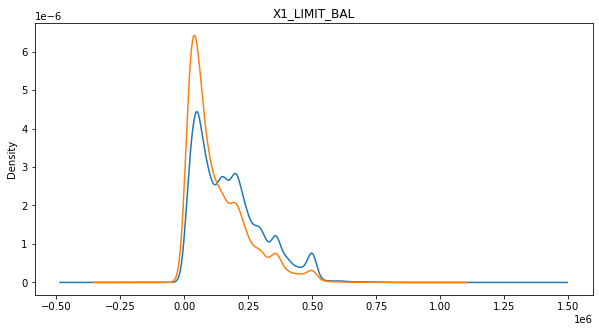

In [156]:
# Code that shows the density function of feature 'X1_LIMIT_BAL' with respect to the target variable 'X24_default payment next month'
plt.figure(figsize=(10,5))
data.groupby('X24_default payment next month', as_index=False)['X1_LIMIT_BAL'].plot(kind='kde',title='X1_LIMIT_BAL')

### Write your answers to questions here

Let's start by analyzing **LDA**. LDA Assumption are:

* Classification problem: This real-world problem is a clasification one because we have two categorical classes: paid/unpaid

* Unimodal gaussian likelihoods: This property stablishes that all variables must be gaussians, wich means that each variable is shaped like a bell curve when plotted. In the following images the distribution of each variable is shown, and it can be perceived that not all of the them gaussian likelihood. Therefore, this assumption is not met and as the data is far to be unimodal gaussian, LDA will lost the complex structure needed for classification.

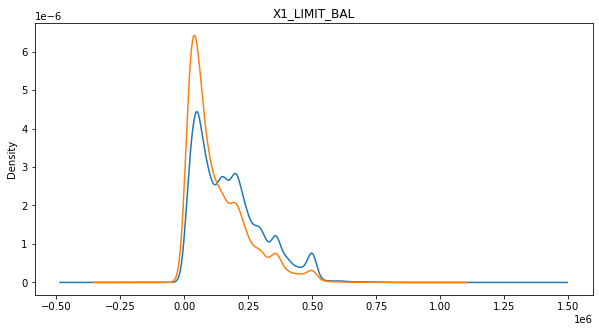

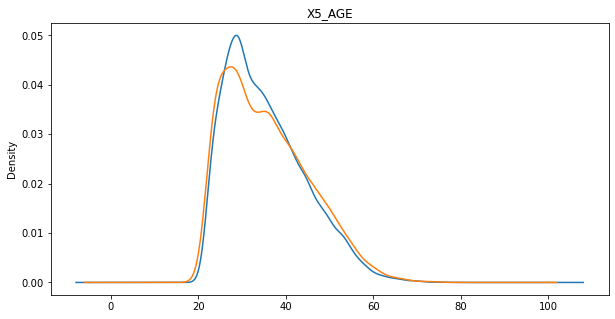

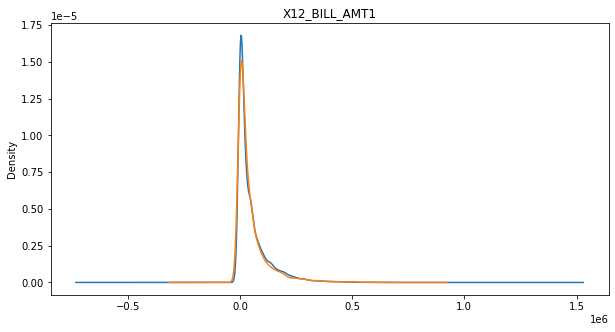

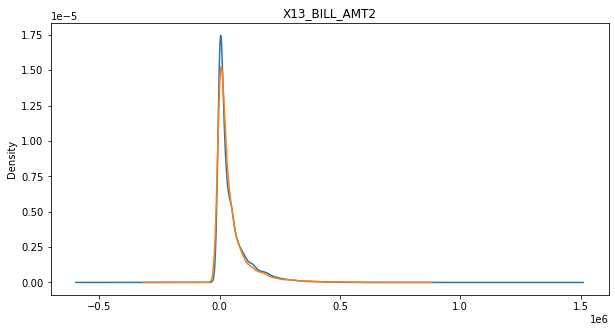

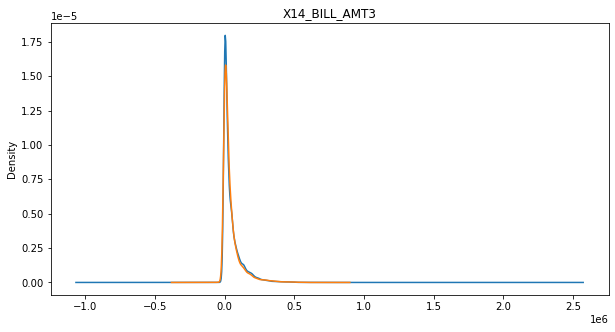

...

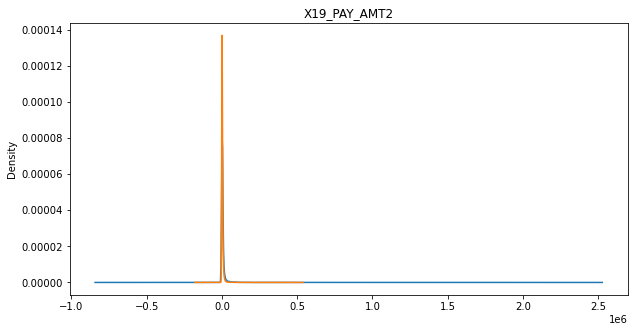

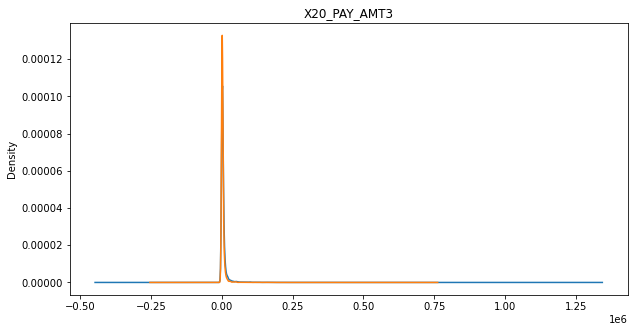

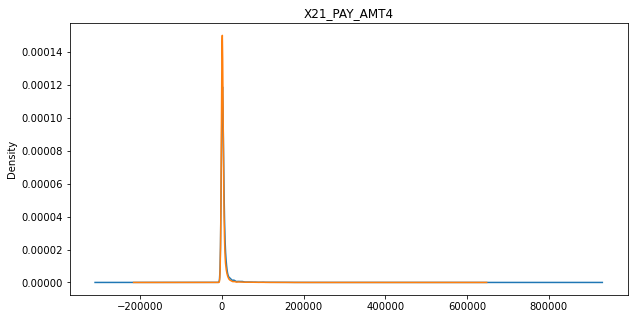

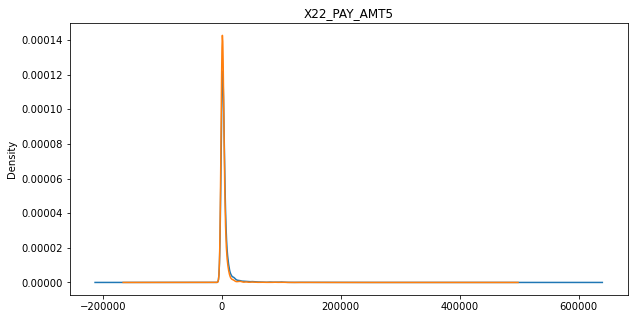

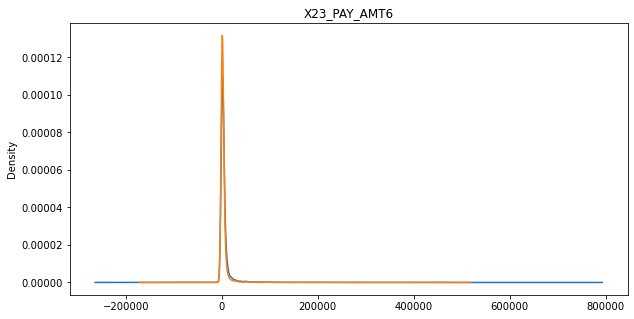

In [148]:
for v in data.columns[0:len(data.columns)-1]:
    plt.figure(figsize=(10,5))
    data.groupby('X24_default payment next month', as_index=False)[v].plot(kind='kde',title=v)

* Homoscedasticity: this property means that variables has the same variance and full rank

In [158]:
np.linalg.matrix_rank(credit_lda.covariance_)

14

In [170]:
np.cov(data[data['X24_default payment next month'] == 0])

array([[5.21384405e+08, 3.29688797e+08, 2.37876879e+08, ...,
        4.62436126e+08, 1.39581187e+09, 8.09721986e+08],
       [3.29688797e+08, 4.56638227e+08, 1.81354359e+08, ...,
        4.27108736e+08, 1.73618216e+09, 3.34187693e+08],
       [2.37876879e+08, 1.81354359e+08, 2.43701223e+08, ...,
        6.48585156e+08, 7.41401758e+08, 3.89809747e+08],
       ...,
       [4.62436126e+08, 4.27108736e+08, 6.48585156e+08, ...,
        1.96067279e+09, 1.50955314e+09, 7.33408956e+08],
       [1.39581187e+09, 1.73618216e+09, 7.41401758e+08, ...,
        1.50955314e+09, 7.79537322e+09, 1.66088238e+09],
       [8.09721986e+08, 3.34187693e+08, 3.89809747e+08, ...,
        7.33408956e+08, 1.66088238e+09, 1.45881778e+09]])

In [171]:
np.cov(data[data['X24_default payment next month'] == 1])

array([[2.65746531e+07, 1.53511598e+08, 7.97952130e+07, ...,
        2.68926715e+07, 6.82880743e+07, 5.90588719e+07],
       [1.53511598e+08, 9.36528802e+08, 3.83228522e+08, ...,
        1.86339469e+08, 4.02886960e+08, 2.78148718e+08],
       [7.97952130e+07, 3.83228522e+08, 9.65368890e+08, ...,
        1.42104513e+08, 5.78523631e+08, 6.65930573e+08],
       ...,
       [2.68926715e+07, 1.86339469e+08, 1.42104513e+08, ...,
        1.08739480e+08, 6.90070811e+07, 8.55437891e+07],
       [6.82880743e+07, 4.02886960e+08, 5.78523631e+08, ...,
        6.90070811e+07, 1.25966147e+09, 3.81030579e+08],
       [5.90588719e+07, 2.78148718e+08, 6.65930573e+08, ...,
        8.55437891e+07, 3.81030579e+08, 4.80137425e+08]])

As it can be seen above, while the variance matrix is full rank, the class covariances are not identical, therefore, the homoscedasticity hypothesis is not met.

Let´s analyze **QDA** hypothesis.

QDA is not much different from LDA except that you assume that the covariance matrix can be different for each class. Therefore, the assumption related to unimodal gaussian is not met either.

**Naïve Bayes** asummes variables are independent given the value of the class variable. In the case of Gaussian Naive Bayes it is also assumed that the likelihood of the feature is assumed to be Gaussian

In [173]:
corr_matrix = np.corrcoef(df_X)
corr_matrix

array([[1.        , 0.97296631, 0.96263282, ..., 0.49263707, 0.36105751,
        0.51622395],
       [0.97296631, 1.        , 0.94059349, ..., 0.58207149, 0.36238039,
        0.40766569],
       [0.96263282, 0.94059349, 1.        , ..., 0.60397493, 0.37261393,
        0.64680965],
       ...,
       [0.49263707, 0.58207149, 0.60397493, ..., 1.        , 0.13472986,
        0.3367588 ],
       [0.36105751, 0.36238039, 0.37261393, ..., 0.13472986, 1.        ,
        0.45601065],
       [0.51622395, 0.40766569, 0.64680965, ..., 0.3367588 , 0.45601065,
        1.        ]])

<center>
~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.<br>
                          THIS IS THE END OF THE NOTEBOOK<br>
~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.~.<br>
</center>